# Exploratory data analysis - Part 2

K2 engineering is an enterprise that makes consulting especially on environmental issues. At this moment K2  is interested in understanding and  predicting noise. Noise is an important variable that affects city planning, wild life, and human health. 

K2 has many stations which are used to measure noise and in some cases other environmental variables. So they have delivered us several csv files with information from the monitoring of environmental noise from various sectors of the city of Bogotá, which must be analyzed to meet the proposed objective: understand environmental noise and predict it.

Continuing with the analysis that began in **EDA-Part1** and using the subsets of data generated there, we created some visualizations to better understand the behavior of environmental noise and its relationships with the available meteorological variables.

Basic statistical summary (mean, minimum, maximum, maximum-minimum variation and median):

- [General Analysis](#General-Analysis)
    - [Component and Variables](#Component-and-Variables)
    - [Frequency types in ambient noise](#Frequency-Types)
- [Temporal analysis](#Temporal-analysis)
    - [By Monitoring Station and Time](#By-Monitoring-Station-and-Time)
    - [By Monitoring Station and Day of the week](#By-Monitoring-Station-and-Day-of-the-week)
    - [By Monitoring Station and Date](#By-Monitoring-Station-and-Date)
    - [By Monitoring Station, Date and Time](#By-Monitoring-Station,-Date-and-Time)
- [Space-Time analysis](#Space-Time-analysis)
- [Correlation analysis](#Correlation-analysis)

In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import plugins
pd.options.display.float_format = '{:,.2f}'.format
plt.rcParams.update({'figure.max_open_warning': 0})

***

## General Analysis

Initially, we observe the measurement units that appear according to the variables to be analyzed.

In [2]:
# Load a small sample of the data to verify the units of measure of the variables
measurement_units = pd.read_csv("../data/raw/aerocivil/estacionmonitoreoruidointeligente7_13_2020-04.csv",sep =';')
measurement_units[["Componente","Variable", "Unidad"]].value_counts()

Componente    Variable              Unidad 
Ruido         Leq                   dBA        278775
              Lmin                  dBA         27884
              L90                   dBA         27884
              L50                   dBA         27884
              L10                   dBA         27884
              Lmax                  dBA         27881
Meteorología  Velocidad del Viento  m/s          7002
              Temperatura Ambiente  Celsius      7002
              Presión Atmosférica   mmHg         7002
              Precipitación         mm           7002
              Humedad Relativa      %            7002
              Dirección del Viento  °            7002
dtype: int64

We observe that the measurement for the noise variables is in decibels (dBA). The decibel scale is logarithmic, which means that the volume is not directly proportional to the intensity of the sound. Instead, the intensity of a sound grows very fast[1](https://www.cdc.gov/nceh/hearing_loss/what_noises_cause_hearing_loss.html).

To understand the content of our dataset, we generate a basic analysis on our data subset, which contains the statistical summary of the columns that is our dataset, which appear as:`Component`, `Variable` and `Tipo`,  taking into account the time element.

In [3]:
# Load data
df_allstation_hour = pd.read_csv("../data/cleaned_data/allstation_hour.csv", sep =';', header =0, encoding='UTF-8')

### Component and Variables

In [4]:
print("Component:",df_allstation_hour.Componente.unique())

Component: ['Meteorología' 'Ruido']


In our data set, as we have seen so far, 90% of the data correspond to environmental noise. [The n-Percent Exceeded Level, Ln](https://www.epd.gov.hk/epd/noise_education/web/ENG_EPD_HTML/m2/types_3.html), is an element that allows us to describe it, it appears in the `Variable` column, it corresponds to the sound pressure level exceeded during n percent of the time. In other words, for n percent of the time, fluctuating sound pressure levels are higher than the Ln level.

The commonly used value of n for the n-percent exceeded level, Ln, are: 10, 50, and 90.

In [5]:
def graph_boxplot(list_component, list_measurement):
    
    sns.set_style("whitegrid")
    plt.figure(figsize=(16,16))
    
    # Rename for chart titles
    dicc_labels ={'Valor_max': 'Max Value',
                 'Valor_mean': 'Average Value',
                 'Valor_median': 'Median Value'
                 }
    # Counter plots
    plt_counter = 1;

    for var in list_component:
        for value in list_measurement:
            plt.subplot(len(list_measurement),3,plt_counter)
            sns.boxplot(x="Variable", y=value, hue="Componente"
                    ,data=df_allstation_hour[df_allstation_hour['Componente']==var]
                    ,showfliers=True
                    , palette="Set2")
            plt.xticks(rotation=90)
            plt.title("{0:s} analysis with\n {1:s}".format( var.replace('Ruido','Environmental noise').replace('Meteorología','Meteorology') 
                                                         ,dicc_labels[value]))
            plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.3)

            plt_counter = plt_counter+1

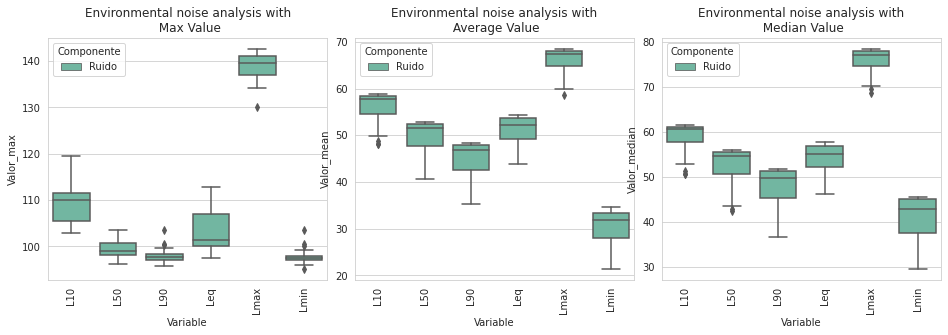

In [6]:
# Environmental noise variables
graph_boxplot(['Ruido'], ['Valor_max', 'Valor_mean','Valor_median'])

After analyzing the previous graphs related to the **environmental noise variables**, we can confirm that our data is consistent with the investigated theory [The n-Percent Exceeded Level, Ln](https://www.epd.gov.hk/epd/noise_education/web/ENG_EPD_HTML/m2/types_3.html):

   -  `L10` is the level exceeded for 10% of the time. For 10% of the time, the sound or noise has a sound pressure level above L10. For the rest of the time, the sound or noise has a sound pressure level at or below L10. These higher sound pressure levels are probably due to sporadic or intermittent events.

   -  `L50` is the level exceeded for 50% of the time. It is statistically the mid-point of the noise readings. It represents the median of the fluctuating noise levels.

   -  `L90` is the level exceeded for 90% of the time. For 90% of the time, the noise level is above this level. It is generally considered to be representing the background or ambient level of a noise environment.

   -  L10 is greater than L50 which in turn is greater than L90

   -  `Leq` is the preferred method to describe sound levels that vary over time, resulting in a single decibel value which takes into account the total sound energy over the period of time of interest.

From the graphs we can establish that the recorded environmental noise moves in a range of **20 to 140 decibels**.


Now we look at the descriptors in **meteorological variables**:

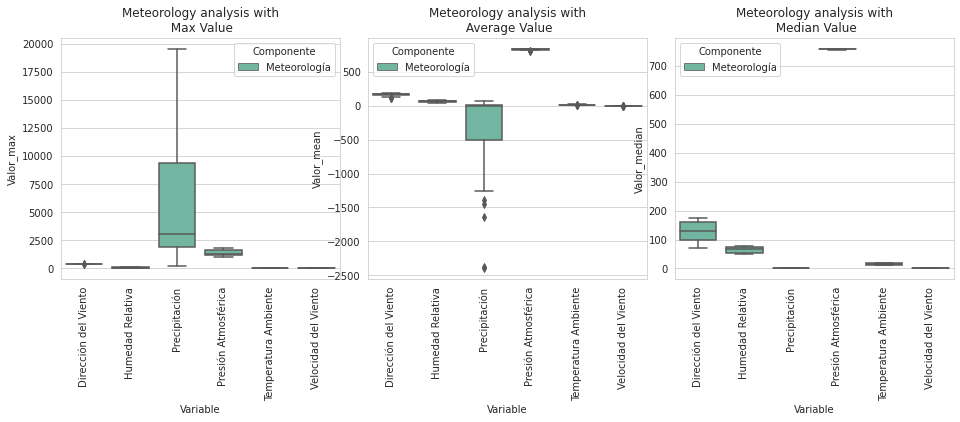

In [7]:
# Meteorological variables
graph_boxplot(['Meteorología'], ['Valor_max', 'Valor_mean','Valor_median'])

The meteorological variables emphasize the climate, we have six main factors: ambient temperature, atmospheric pressure, relative humidity, precipitation, and wind speed and direction.
We observe that rainfall moves in very different ranges of values compared to the other variables, and the values of this seem to be mostly below zero.

***

### Frequency Types

The unit of [frequency](https://www.who.int/docstore/peh/noise/Commnoise2.htm) is the Hertz (Hz), and it refers to the number of vibrations per second of the air in which the sound is propagating.  Most environmental sounds, however, are made up of a complex mix of many different frequencies. Below we see the different frequencies reported and their behavior.

In [8]:
# Load data
df_allstation_hour_hz = pd.read_csv("../data/cleaned_data/allstation_hour_hz.csv", sep =';', header =0, encoding='UTF-8')
print(df_allstation_hour_hz.columns)

Index(['Componente', 'Variable', 'Tipo', 'Hora', 'Valor_max', 'Valor_mean',
       'Valor_median', 'Valor_min', 'max-min'],
      dtype='object')


Text(0.5, 1.0, 'Environmental noise analysis per hour - frequency type')

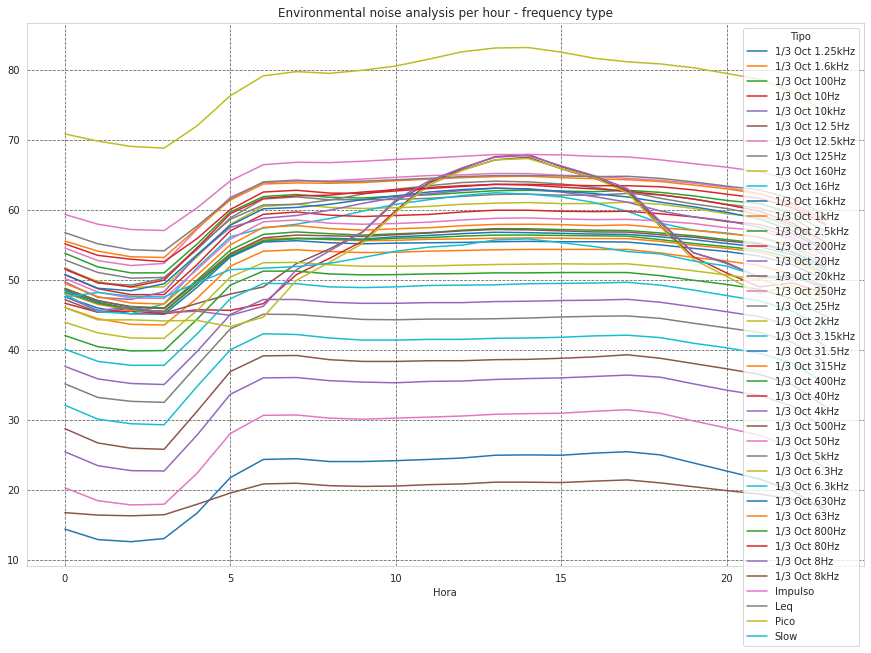

In [9]:
fig, ax = plt.subplots(figsize=(15,10))
df_allstation_hour_hz[df_allstation_hour_hz['Componente']=='Ruido'].groupby(['Hora','Tipo']).median()['Valor_median'].unstack().plot(ax=ax, kind = 'line')
plt.grid(b=True, which='major', color='#666666', linestyle='--')
plt.title("Environmental noise analysis per hour - frequency type")

Observing the behavior of some types of frequency per hour:

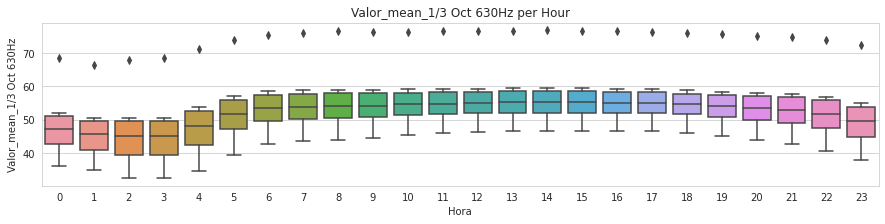

In [10]:
# Valor mean_1/3 Oct 630Hz
df_wide_general = df_allstation_hour_hz.pivot_table(index=[ 'Componente','Hora','Variable'],columns=['Tipo'],values=['Valor_mean'])
df_wide_general.columns = ["_".join(x) for x in df_wide_general .columns.ravel()]
df_wide_general.reset_index(inplace=True)
df_wide_general.head()
fig, ax = plt.subplots(figsize=(15,3))
sns.boxplot(x='Hora', y='Valor_mean_1/3 Oct 630Hz', data=df_wide_general)
plt.title("Valor_mean_1/3 Oct 630Hz per Hour")
plt.show()

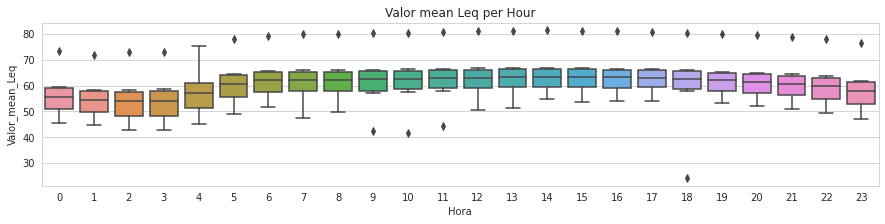

In [11]:
fig, ax = plt.subplots(figsize=(15,3))
sns.boxplot(x='Hora', y='Valor_mean_Leq', data=df_wide_general)
plt.title("Valor mean Leq per Hour")
plt.show()

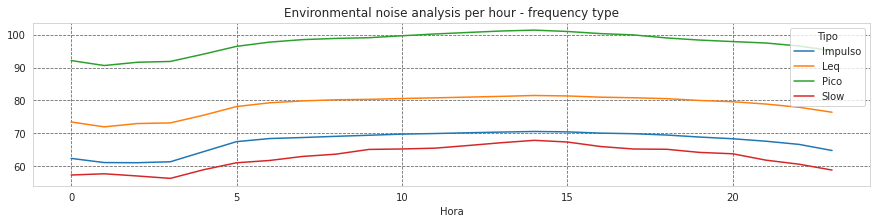

In [12]:
# Impulso, Leq, Pico, Slow
frequencies_to_search=['Impulso','Leq','Pico','Slow']
df_filtered_hertz = df_allstation_hour_hz[(df_allstation_hour_hz['Componente']=='Ruido') &(df_allstation_hour_hz['Tipo'].isin(frequencies_to_search))]
fig, ax = plt.subplots(figsize=(15,3))
df_filtered_hertz.groupby(['Hora','Tipo']).max()['Valor_mean'].unstack().plot(ax=ax, kind = 'line')
plt.grid(b=True, which='major', color='#666666', linestyle='--')
plt.title("Environmental noise analysis per hour - frequency type")
plt.show()

We find a similar behavior in the frequencies of ambient noise per hour: from 4 in the morning there is an increase in noise levels and around 18 it begins to decrease. The main difference in these frequencies is in the decibel range in which they move.

***

## Temporal analysis

With the previous analysis we began to notice some patterns of the noise with the change of the hours, then we generated a function to graph the behavior of the noise in different time groups in each of the stations.

In [13]:
def plot_line(df,time_var,plot_title):
    for i in df['Estación'].unique():
        fig, ax = plt.subplots(figsize=(15,2))
        df_estacion = df[df['Estación']== i]
        df_estacion.groupby([time_var,'Variable']).max()['Valor_median'].unstack().plot(ax=ax, kind = 'line')
        plt.grid(b=True, which='major', color='#666666', linestyle='--')
        plt.title("{0:s} - {1:s} ".format(plot_title,i))
        plt.xticks(rotation=90)


### By Monitoring Station and Time

In [14]:
# Statistical Summary by Station - Hour
df_hour_group = pd.read_csv("../data/cleaned_data/df_group_hora.csv", sep =';', header =0, encoding='UTF-8')

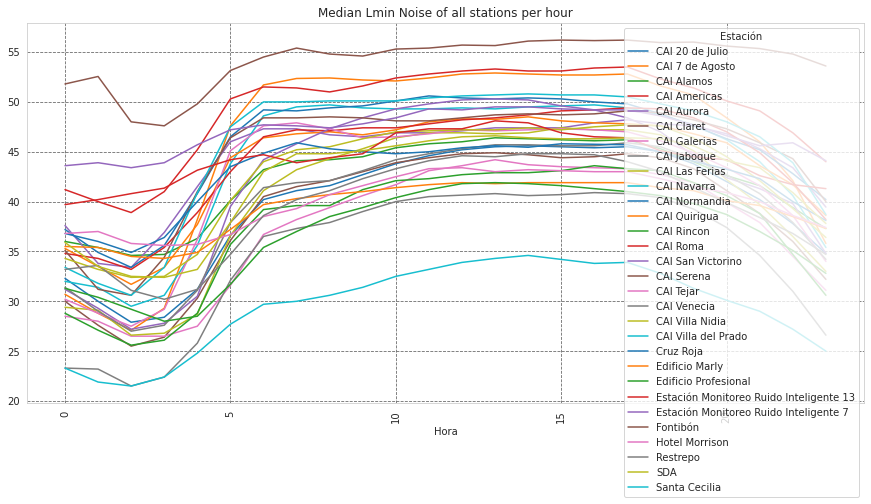

In [15]:
#  plot Median Lmin Noise of all stations per hour
fig, ax = plt.subplots(figsize=(15,7))

df_hour_group[df_hour_group['Variable']=='Lmin'].groupby(['Hora'
                                                          ,'Estación']).mean()['Valor_median'].unstack().plot(ax=ax, kind = 'line')
plt.grid(b=True, which='major', color='#666666', linestyle='--')
plt.xticks(rotation=90)
plt.title("Median Lmin Noise of all stations per hour")
plt.show()

In the case of `Lmin` levels that the station takes during the day, we see that in general it begins to increase and decrease towards the same hours of the day. On the one hand, the **Fontibón** station presents minimum values well above the other stations, which suggests that in general it is a station with critical levels compared to the others. On the other hand, the **Santa Cecilia** monitoring station may have lower levels during certain hours of the day, indicating that it can be a very quiet sector.

In [16]:
# Median Leq Noise of all stations per hour
from plotly.graph_objects import Layout
data_leq = df_hour_group[df_hour_group['Variable']=='Leq']

fig = px.line(data_leq, x="Hora", y="Valor_median", color="Estación", hover_name="Estación"
             ,title="Median Leq Noise of all stations per hour")
fig.show()

As Leq is the equivalent continuous sound level throughout the period, it is highlighted that `CAI Americas`, `CAI 7 de Agosto`, `CAI Serena` and `Fontibón` have the highest average noise levels compared to the other stations. Additionally, we continue to observe a trend between stations in which noise begins to increase from 3 in the morning and from 8pm onwards, it begins to gradually decrease, probably related to the start of daily activities.

Likewise, we note that the season that shows the most variance on the day is the station `Estación Monitoreo Ruido Inteligente 13`, it may be related to the fact that for this season we only have one month of data.

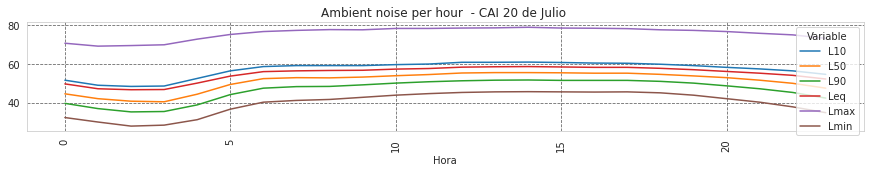

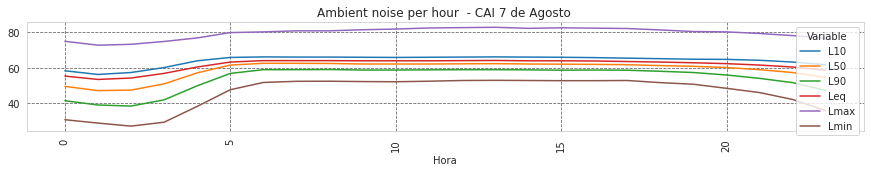

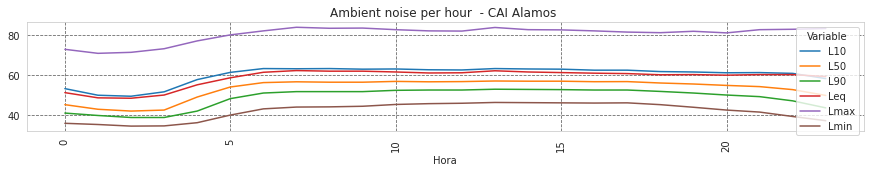

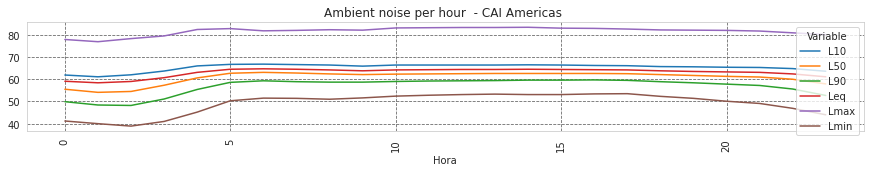

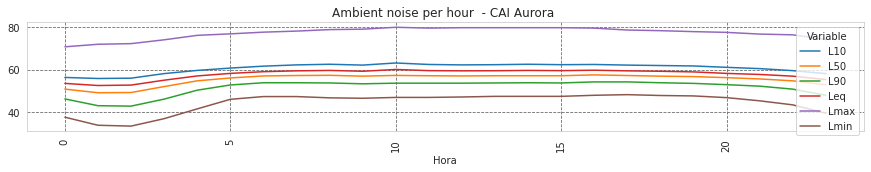

...

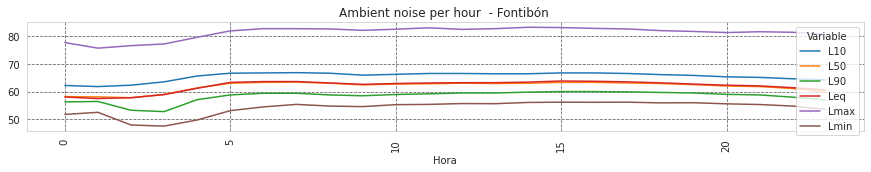

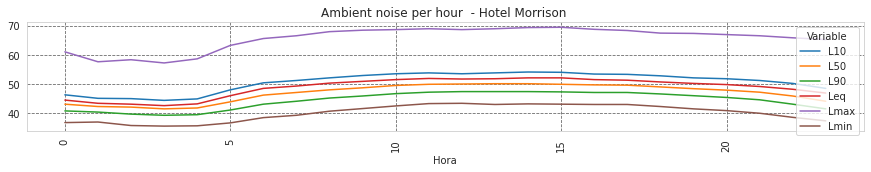

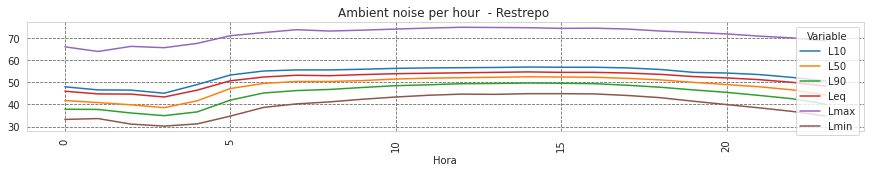

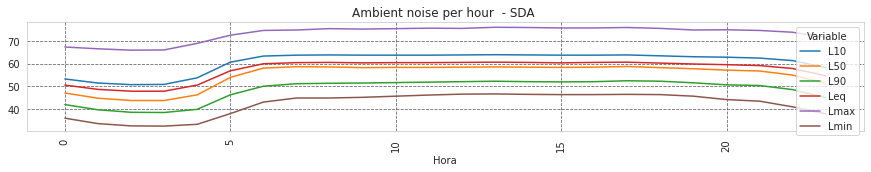

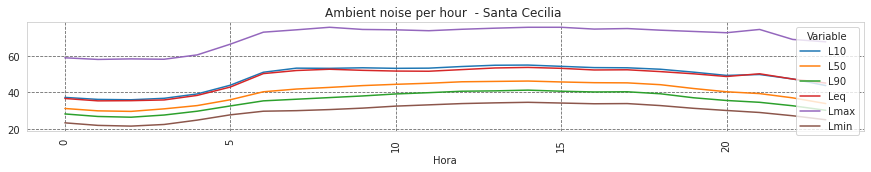

In [17]:
# plot ambient noise for each station per hour
plot_line(df_hour_group[df_hour_group['Componente']=='Ruido'],'Hora','Ambient noise per hour ')

Observing carefully by station the behavior of the variables, highlights the `Cruz Roja` station, the general panorama shows that in equivalent Leq values, there is an average noise level greater than the previous station and, in turn, we can observe how the constant level line Leq is close to that of L10 levels, which indicates stable higher values 10% of the time, and in general, for the station during active hours of the day this station can be considered high average noise levels.

Without losing sight of the meteorological variables, they show us the following:

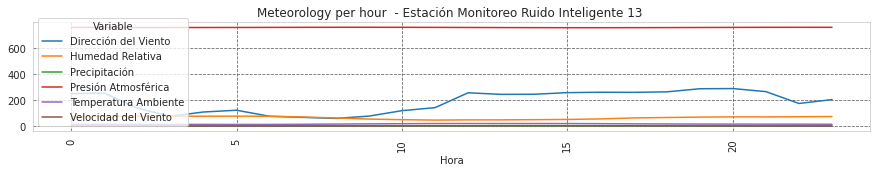

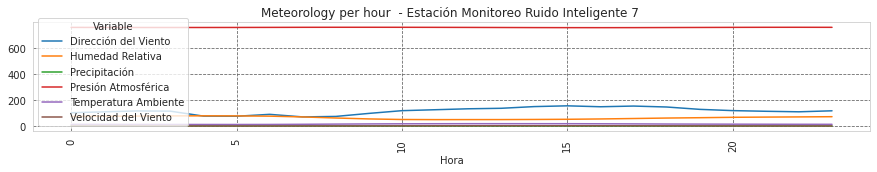

In [18]:
# 
plot_line(df_hour_group[df_hour_group['Componente']=='Meteorología'],'Hora','Meteorology per hour ')

The meteorological variables move in different ranges, the behavior of the wind direction seems to have a small resemblance with the behavior of noise, only that its increase begins to occur after 10 am.

### By Monitoring Station and Day of the week

In [19]:
# Statistical Summary by Station - Day of the week
df_day_group = pd.read_csv("../data/cleaned_data/df_group_dia.csv", sep =';', header =0, encoding='UTF-8')
# Sort Days
df_day_group['Dia'] = pd.Categorical(df_day_group['Dia']
  , categories= ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday']
  , ordered=True)

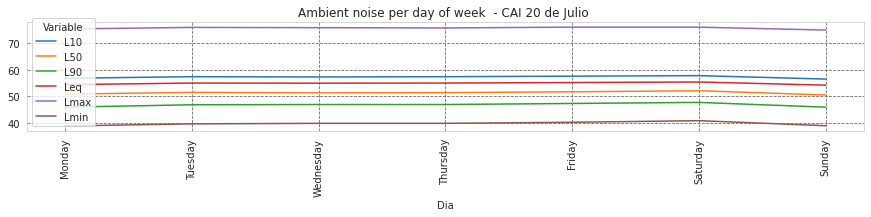

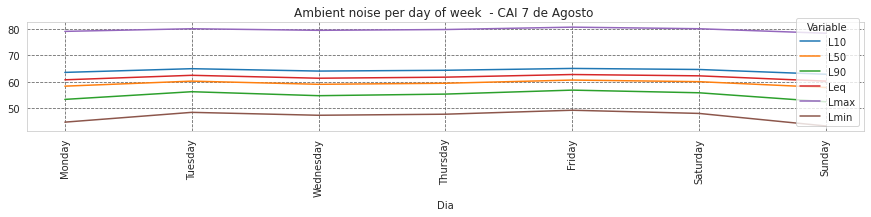

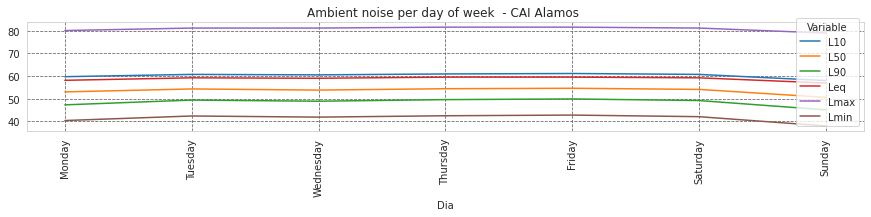

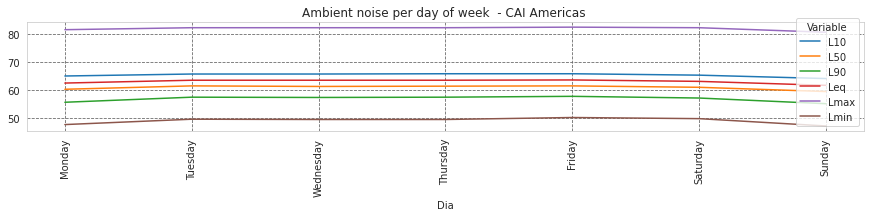

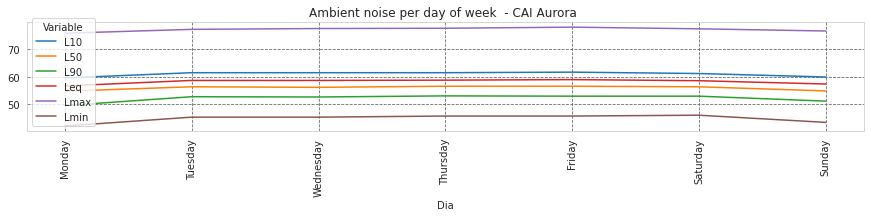

...

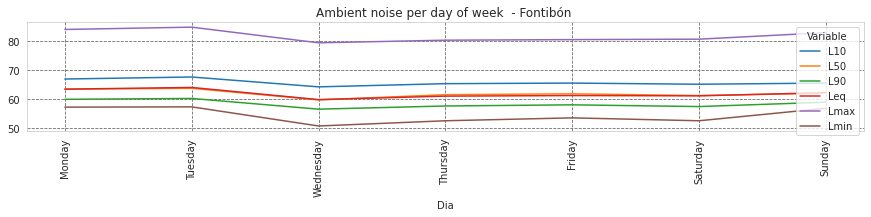

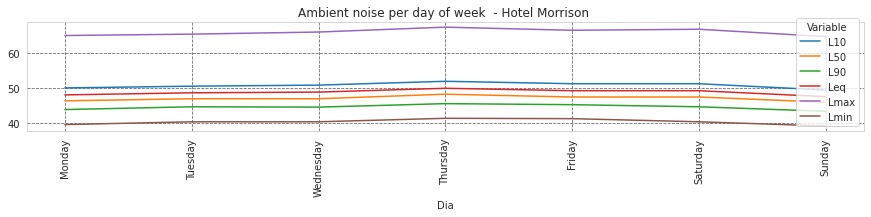

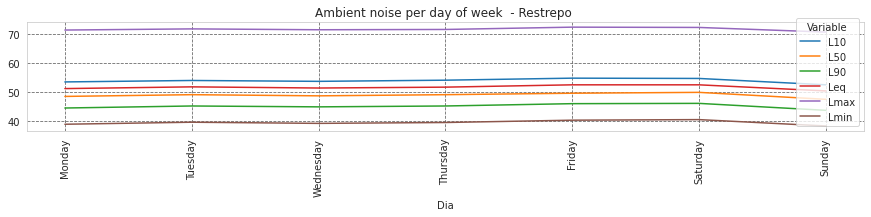

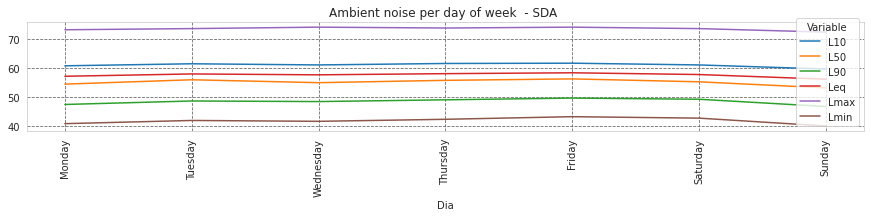

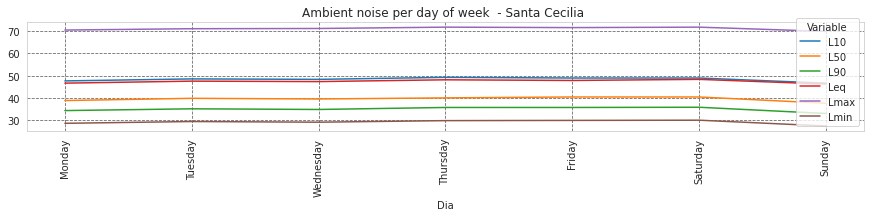

In [20]:
plot_line(df_day_group[df_day_group['Componente']=='Ruido'],'Dia','Ambient noise per day of week ')

The general trend for the stations is an approximate steady noise level from monday to saturday with a minimum level on sunday. But, for example for Edificio Profesional, the noise increases on Fridays, and in Fontibon is on saturdays.

Although, the focus is on environmental noise, we review some meteorological variables to understand their behavior and later verify whether or not they have a correlation with it. We can notice that the variations per day of these variables depend a lot on the place.

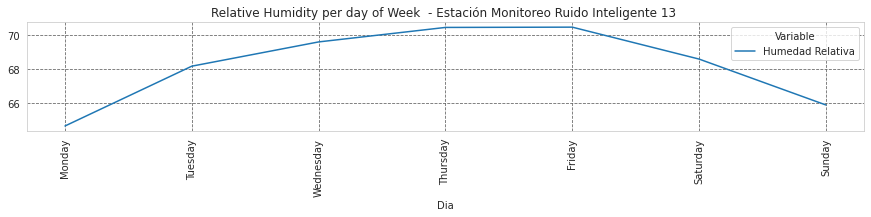

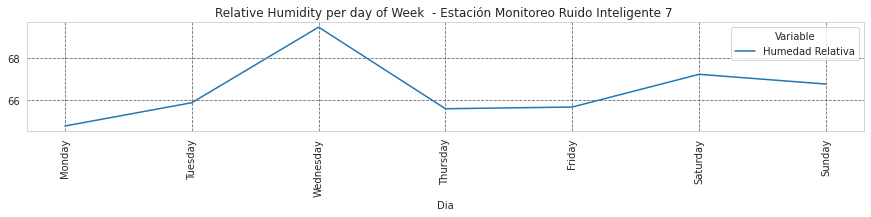

In [21]:
plot_line(df_day_group[(df_day_group['Componente']=='Meteorología') & (df_day_group['Variable'].isin(['Humedad Relativa']))],'Dia','Relative Humidity per day of Week ')

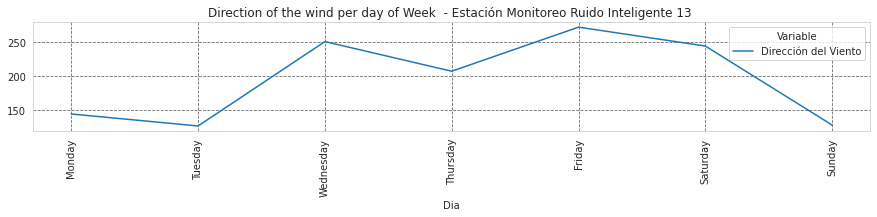

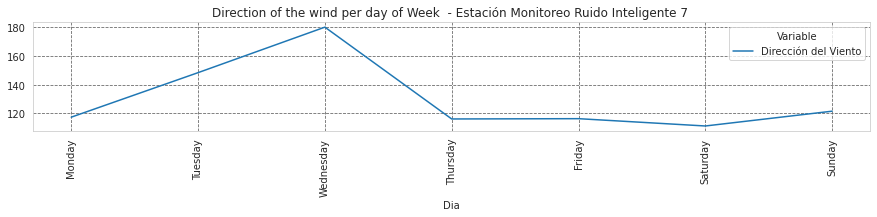

In [22]:
plot_line(df_day_group[(df_day_group['Componente']=='Meteorología') & (df_day_group['Variable'].isin(['Dirección del Viento']))],'Dia','Direction of the wind per day of Week ')

## By Monitoring Station and Date

In [23]:
# Statistical Summary by Station - Hour
df_date_group = pd.read_csv("../data/cleaned_data/df_group_fecha.csv", sep =';', header =0, encoding='UTF-8')

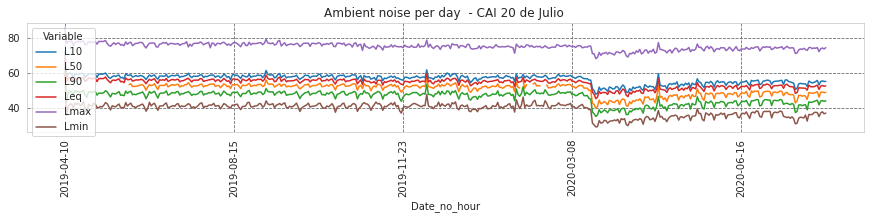

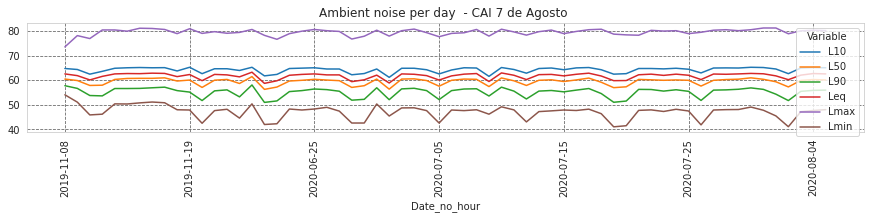

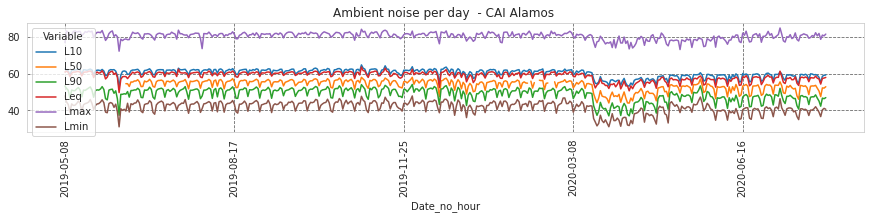

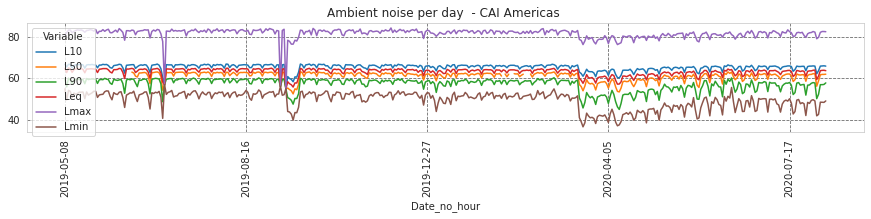

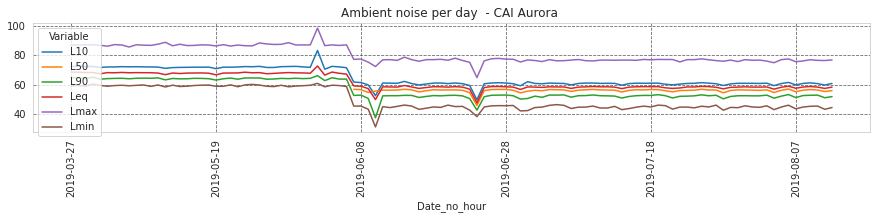

...

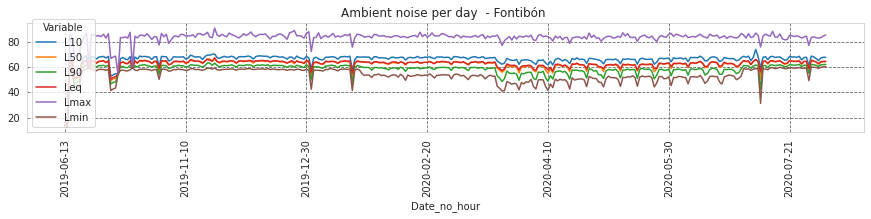

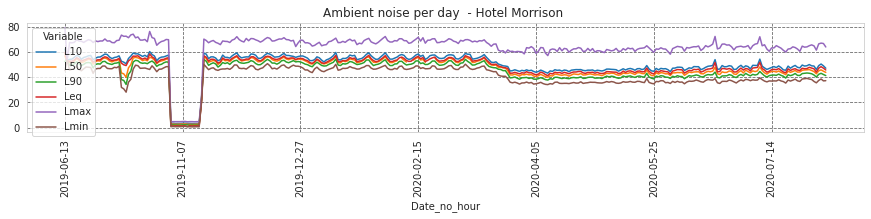

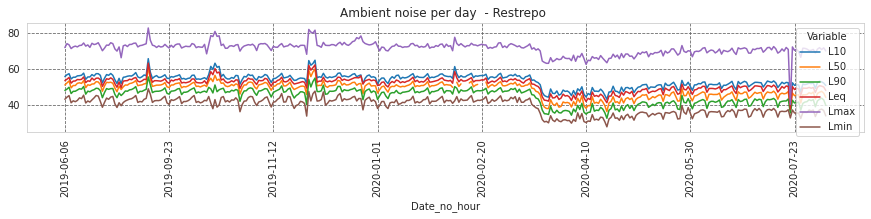

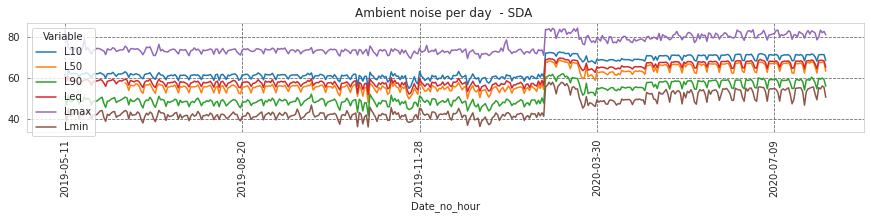

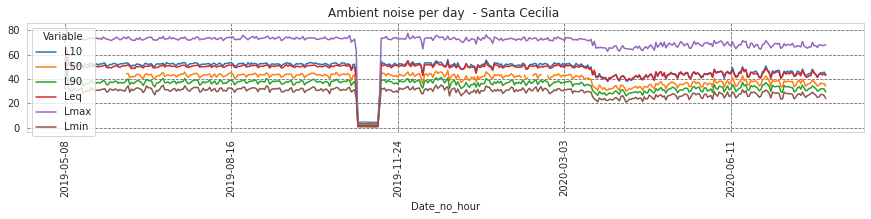

In [24]:
plot_line(df_date_group[df_date_group['Componente']=='Ruido'],'Date_no_hour','Ambient noise per day ')

It is interesting that from the middle of March, when the quarantines in the city began due to the COVID -19 pandemic, a decrease in noise levels is shown in the vast majority of stations, reflecting the influence of the context and economic activities on environmental noise.

Other notable data are:

- The monitoring station `7 de Agosto`, has a somewhat different pattern than the other stations, its noise variations seem to occur over a longer period compared to the other stations.
- The `San Victorino` station began to register the decrease in noise levels since June 2019.
- The `Cruz Roja` Station varies normally from October 2019 to January 2020, but as of February, higher and lower values are observed compared to the previous months.



## By Monitoring Station, Date and Time

In [25]:
# Statistical Summary by Station - Date no hour
df_date_hour_group = pd.read_csv("../data/cleaned_data/df_group_fecha_hora.csv", sep =';', header =0, encoding='UTF-8',parse_dates=['Date_no_hour'] )

In [26]:
df_wide = df_date_hour_group.pivot_table(index=['Origen','Estación','Date_no_hour','Hora']
                               ,columns=['Componente','Variable'],values=['Valor_mean'])
df_wide.columns = ["_".join(x) for x in df_wide .columns.ravel()]
df_wide.reset_index(inplace=True)

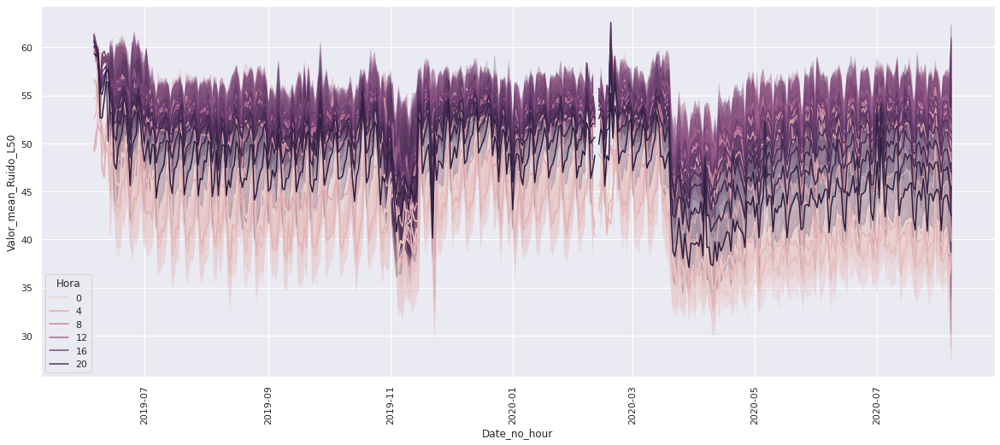

In [27]:
sns.set(rc={'figure.figsize':(20,8)})

ax = sns.lineplot(x="Date_no_hour", 
             y='Valor_mean_Ruido_L50'
            ,hue = 'Hora'
            ,data=df_wide)

plt.xticks(rotation=90)
plt.show()

With the temporal analysis we can conclude that the noise does not remain stable, it is always varying with the passage of time, however, a good approach to understand it is with the passage of time.

In the time available for data analysis we have that between 0 and 4 in the morning, the noise levels remain low, strangely they pass 50db and the highest values are usually shown between 2 and 4 in the afternoon.

***

## Space Time analysis

With the graphs of boxes and lines we have managed to better understand the behavior of noise, now to facilitate the spatial location we generate a map in order to observe the distribution of the monitoring stations and also their noise levels, especially, in hours, the which has been the period of time that best gave us details of the variations.

In [28]:
variable = 'Leq'
medida = 'Valor_mean'

In [29]:
data_map = df_hour_group[(df_hour_group['Variable']== variable)].copy()

**Average noise Leq per hour**

In [30]:
# list of hours
hours = data_map['Hora'].unique()

# Find highest value
max_value = int(data_map[medida].max())

# 
data_map['scaled_weight'] = (data_map[medida]/max_value)

f = folium.Figure(width=900, height=400)

map_stations = folium.Map(location=[4.60971, -74.08175],
                    zoom_start = 11).add_to(f)

# List comprehension to make out list of lists
heat_data = [[[row['latitud'],row['longitud'], row['scaled_weight']] for index, row in data.iterrows()] for data in [data_map[data_map['Hora'] == hour] for hour in hours]]

heat_data

# Map title
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Average noise Leq per hour</b></h3>
             '''
map_stations.get_root().html.add_child(folium.Element(title_html))

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,auto_play=True)
hm.add_to(map_stations)
# # Display the map
map_stations

**Median noise Leq per hour - Type Leq**

In [31]:
df_hour_group_hz_lat_long = pd.read_csv("../data/cleaned_data/df_group_hora_hz.csv", sep =';', header =0, encoding='UTF-8')

variable = 'Leq'
medida = 'Valor_median'
tipo ='Leq'

data_map = df_hour_group_hz_lat_long[(df_hour_group_hz_lat_long['Variable']== variable)
                                     & (df_hour_group_hz_lat_long['Tipo']== tipo)]
# 
fig_map1 = px.density_mapbox(data_map, lat='latitud', lon='longitud'
                        , z= medida
                        , radius=40
                        ,animation_group = 'Estación'
                        ,animation_frame  = 'Hora'
                        ,hover_name = 'Estación'
                        ,color_continuous_scale ="Jet"
                        ,title="Median Leq Noise of all stations per hour"
                        ,opacity=0.9
                       )
fig_map1.update_layout(mapbox_style="stamen-toner",
                  mapbox_zoom=9.5
                  , mapbox_center = {"lat": 4.65, "lon": -74.08175}
                 )
# fig_map1.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_map1.show()

It should be noted that the highest average Leq noise is concentrated in areas near the airport and in some areas of the city center, such as: `7 de Agosto`,`SDA`. Likewise, we can observe the increase in noise with the passage of time in some monitoring stations more than in others.

## Correlation analysis

Using our pivoted data set, we began to analyze the correlations between the available variables of environmental noise and meteorology.

In [32]:
df_wide[df_wide['Origen']=='aerocivil'].head(2)
df_wide.dtypes

Origen                                                  object
Estación                                                object
Date_no_hour                                    datetime64[ns]
Hora                                                     int64
Valor_mean_Meteorología_Dirección del Viento           float64
Valor_mean_Meteorología_Humedad Relativa               float64
Valor_mean_Meteorología_Precipitación                  float64
Valor_mean_Meteorología_Presión Atmosférica            float64
Valor_mean_Meteorología_Temperatura Ambiente           float64
Valor_mean_Meteorología_Velocidad del Viento           float64
Valor_mean_Ruido_L10                                   float64
Valor_mean_Ruido_L50                                   float64
Valor_mean_Ruido_L90                                   float64
Valor_mean_Ruido_Leq                                   float64
Valor_mean_Ruido_Lmax                                  float64
Valor_mean_Ruido_Lmin                                  

**Plot Correlations Average Values**

Text(0.5, 1.0, 'Plot Correlations Average Values Leq Frequencies')

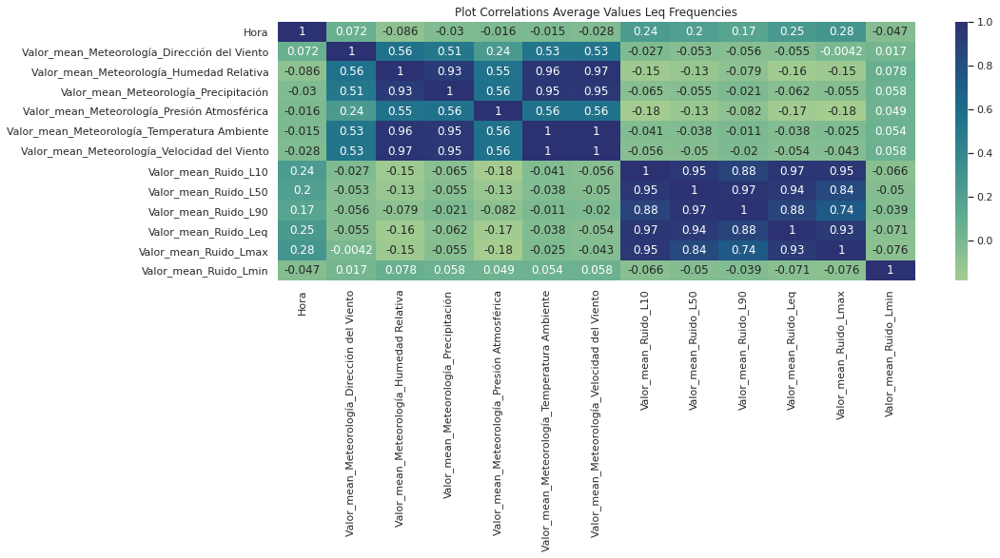

In [33]:
# Plot Correlations Average Values
plt.figure(figsize=(15,5))
corr_mat  = df_wide[df_wide['Origen']=='aerocivil'].corr()
sns.heatmap(corr_mat,cmap=sns.color_palette("crest", as_cmap=True), annot=True)
plt.title("Plot Correlations Average Values Leq Frequencies")

**Plot Correlations Median Values**

In the previous graph we saw that the correlation values, taking the average values are giving very close to zero, thinking that these may be strongly affected by outliers, we decided to carry out the same process but with the average value, thus avoiding the problem of extreme values.

Text(0.5, 1.0, 'Plot Correlations Median Values Leq Frequencies')

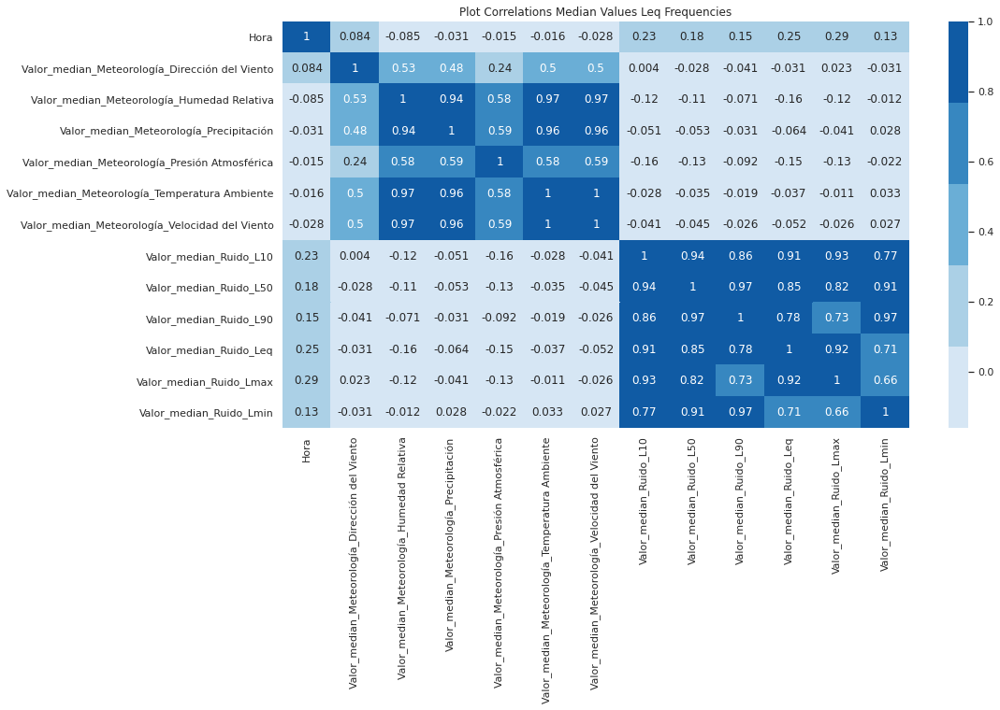

In [34]:
df_wide_median = df_date_hour_group.pivot_table(index=['Origen','Estación','Date_no_hour','Hora']
                               ,columns=['Componente','Variable'],values=['Valor_median'])
df_wide_median.columns = ["_".join(x) for x in df_wide_median .columns.ravel()]
df_wide_median.reset_index(inplace=True)
plt.figure(figsize=(15,8))
corr_mat_median  = df_wide_median[df_wide_median['Origen']=='aerocivil'].corr()
sns.heatmap(corr_mat_median,cmap=sns.color_palette(sns.color_palette("Blues", 5), as_cmap=True), annot=True)
plt.title("Plot Correlations Median Values Leq Frequencies")

Although the correlations improve, they are still very close to zero, indicating that there are no linear correlations between these variables. Unfortunately, we only have very little meteorology data, and apparently strong outliers at these 2 monitoring stations. We will review the outlies of the meteorological variables and we will analyze the correlations again.

In [35]:
list_variables = df_date_hour_group[df_date_hour_group['Componente']=='Meteorología']['Variable'].unique()

## Scatterplot between Leq vs meteorological variables


In order to help us identify patterns or clusters in the available noise data, we take the average Leq values to generate a scatterplot with each of the meteorological variables.

**Scatterplot between Leq vs meteorological variables**

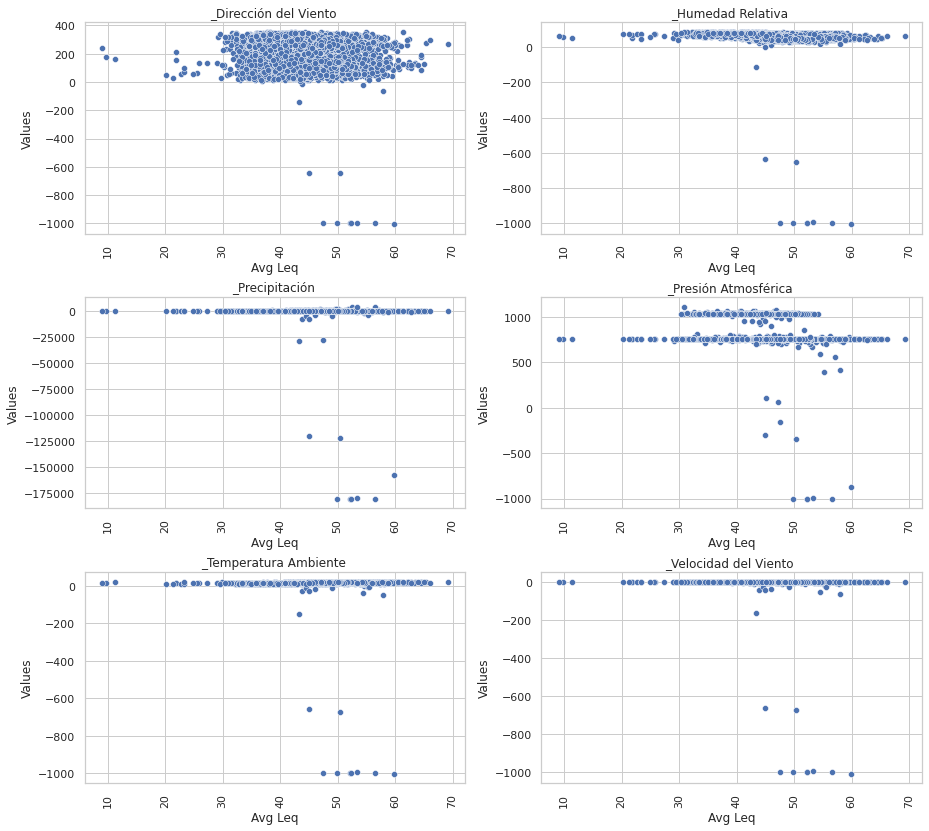

In [36]:
# Scatterplot between Leq vs meteorological variables
list_variables = [string for string in df_wide.columns if 'Meteorología' in string]

sns.set_style("whitegrid")
plt.figure(figsize=(15,14))
    
for i,var in enumerate(list_variables):
    plt.subplot(len(list_variables)//2,2,i+1)
    sns.scatterplot(data = df_wide
                    , x ="Valor_mean_Ruido_Leq"
                    , y = var
                    )
    plt.xticks(rotation=90)
    plt.xlabel("Avg Leq")
    plt.ylabel("Values")
    plt.title("{0:s} ".format(var.replace('Valor_mean_Meteorología','')))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)


We note that there are several quite strong outliers, which may be affecting our correlations. These outliers are mainly values less than zero in the meteorological variables.

**Scatter diagram between Leq vs meteorological variables without outliers less than 0**

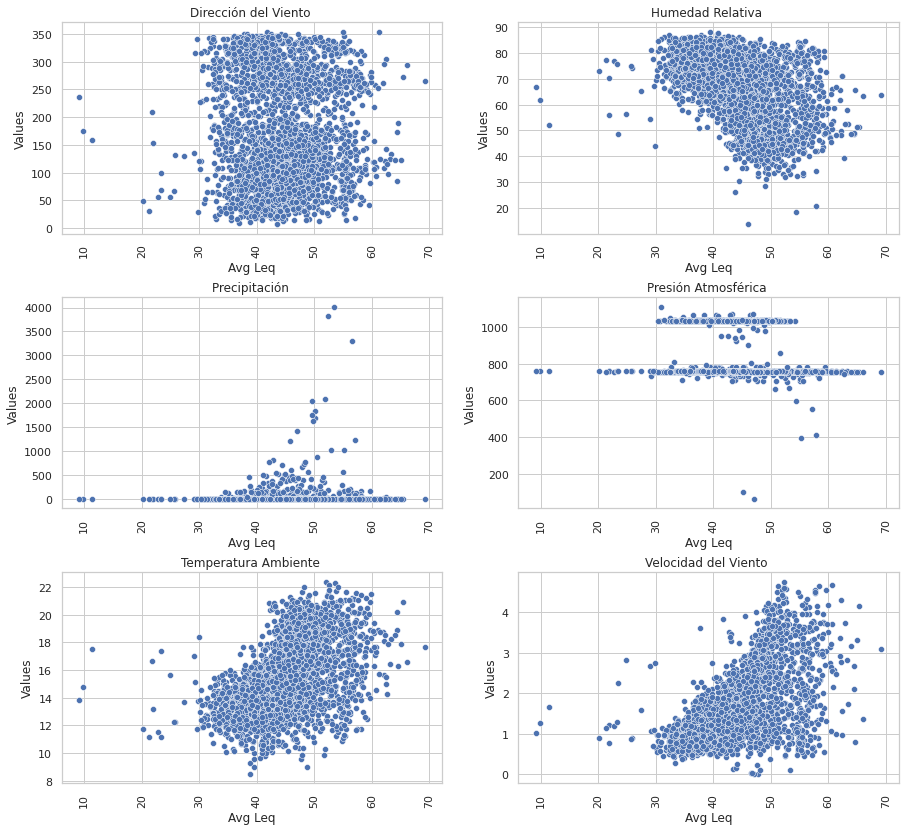

In [37]:
# Scatter diagram between Leq vs meteorological variables without outliers less than 0
list_variables = [string for string in df_wide.columns if 'Meteorología' in string]

sns.set_style("whitegrid")
plt.figure(figsize=(15,14))
    
for i,var in enumerate(list_variables):
    plt.subplot(len(list_variables)//2,2,i+1)
    sns.scatterplot(data = df_wide[df_wide[var]>=0]
                    , x ="Valor_mean_Ruido_Leq"
                    , y = var
                    )
    plt.xticks(rotation=90)
    plt.xlabel("Avg Leq")
    plt.ylabel("Values")
    plt.title("{0:s} ".format(var.replace('Valor_mean_Meteorología_','')))
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)


Eliminating the values below zero shows a better relationship and trend of the average Leq noise data, especially, what has to do with relative humidity, ambient temperature and wind speed.

### Correlations excluding outliers

In [38]:
list_variables = df_date_hour_group[df_date_hour_group['Componente']=='Meteorología']['Variable'].unique()

Text(0.5, 1.0, 'Plot Correlations Median Values Leq Frequencies- excluding outliers ')

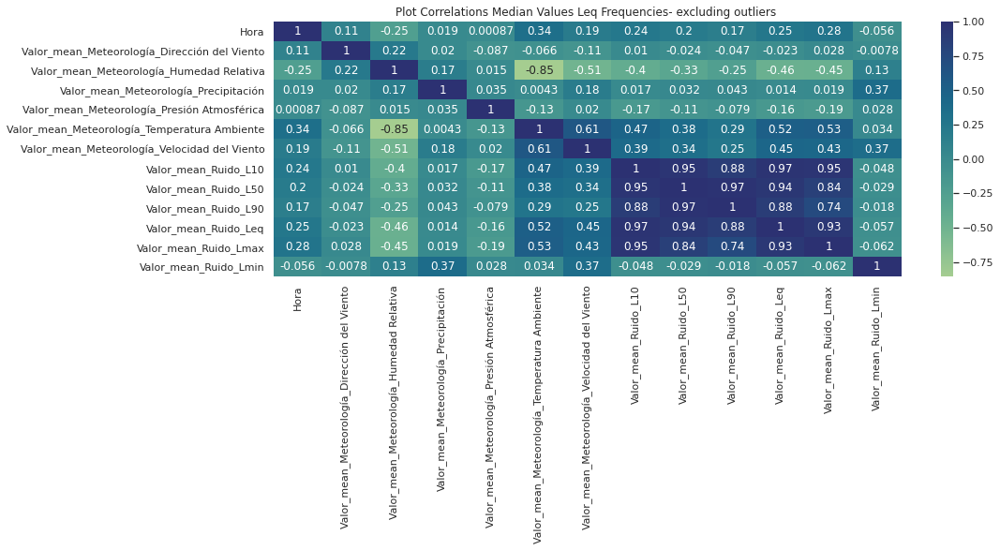

In [39]:
# Data set excluding values less than zero for ambient temperature and relative humidity.
df_wide_test = df_wide[(df_wide["Valor_mean_Meteorología_Temperatura Ambiente"]>=0) & (df_wide["Valor_mean_Meteorología_Humedad Relativa"]>=0)]

plt.figure(figsize=(15,5))
corr_mat  = df_wide_test[df_wide_test['Origen']=='aerocivil'].corr()
sns.heatmap(corr_mat,cmap=sns.color_palette("crest", as_cmap=True), annot=True)
plt.title("Plot Correlations Median Values Leq Frequencies- excluding outliers ") 

Finally, we observe some correlations between the average environmental noise Leq and 3 meteorological variables, the coefficients show a weak correlation, however, we can conclude the following:
The _ambient temperature_ with a correlation coefficient of 0.52, and the_ Wind speed_ with a coefficient of 0.45 indicate a positive correlation in which the ambient noise increases at higher ambient temperature or wind speed, it occurs, the opposite occurs with _Humidity Relative_ with a negative correlation coefficient of -0.46.

To continue with the noise analysis and prediction process, we require external data that are presented later in the creation of the experimental models.

***